In [35]:
#importing the necessary modules
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from scipy import stats
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.model_selection import train_test_split

*Week 01:*

**Objective:-**
To set up the project environment and gather the necessary data for model development.

In [36]:
# Loading the given dataset as 'credit_df'
credit_df = pd.read_csv('/content/credit.csv')

## **Data Preprocessing**

In [37]:
credit_df.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

In [38]:
# Get the shape of the 'credit_df'
df_shape = credit_df.shape

# Print the number of features and observations
print(f"Number of Features:{df_shape[1]-1}")
print(f"Number of Observations:{df_shape[0]}")

Number of Features:27
Number of Observations:100000


In [39]:
# Displaying information about the 'credit_df'
credit_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  int64  
 1   Customer_ID               100000 non-null  int64  
 2   Month                     100000 non-null  int64  
 3   Name                      100000 non-null  object 
 4   Age                       100000 non-null  float64
 5   SSN                       100000 non-null  float64
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  float64
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  float64
 10  Num_Credit_Card           100000 non-null  float64
 11  Interest_Rate             100000 non-null  float64
 12  Num_of_Loan               100000 non-null  float64
 13  Type_of_Loan              100000 non-null  ob

## **Missing Values**

In [40]:
# Checking missing value
if not credit_df.isna().sum().any():
    print("'credit_df' does not have any null values.")

'credit_df' does not have any null values.


## **Duplicate Values**

In [41]:
# Checking duplicate value
if not credit_df.duplicated().any():
    print("'credit_df' does not have any duplicate value.")

'credit_df' does not have any duplicate value.


## **Outliers Checking and Handling**

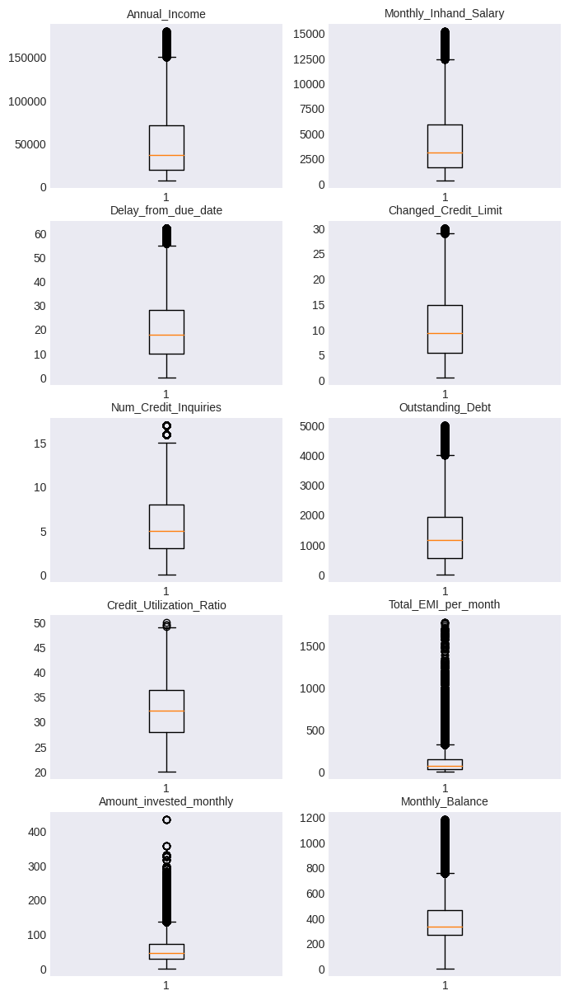

In [42]:
# Define the columns with potential outliers
outlier_columns = ['Annual_Income', 'Monthly_Inhand_Salary',
                   'Delay_from_due_date', 'Changed_Credit_Limit',
                   'Num_Credit_Inquiries', 'Outstanding_Debt',
                   'Credit_Utilization_Ratio', 'Total_EMI_per_month',
                   'Amount_invested_monthly', 'Monthly_Balance',]

# Setting the plot style and figure size
plt.style.use('seaborn-v0_8-dark')
plt.figure(figsize=(8,15))

# Iterate through the outlier columns and create boxplots
for n,i in zip(range(1,11),range(0,10)):
    plt.subplot(5,2,n)
    plt.boxplot(credit_df[outlier_columns[i]])
    plt.title(outlier_columns[i], fontsize=10)

# Display the plot
plt.show()

### Above result implies median values are better for replacing outliers.

In [43]:
#function to list out the outlier values
def detect_outliers_iqr(data):
    outliers = []
    data = sorted(data)
    q1 = np.percentile(data, 25)
    q3 = np.percentile(data, 75)
    IQR = q3-q1
    lwr_bound = q1-(1.5*IQR)
    upr_bound = q3+(1.5*IQR)
    for i in data:
        if (i<lwr_bound or i>upr_bound):
            outliers.append(i)
    return outliers

In [44]:
#outliers with median value
for feature in outlier_columns:
    outliers = detect_outliers_iqr(credit_df[feature])
    impute_value = credit_df[feature].median()
    filter = credit_df[feature] >= np.min(outliers)
    credit_df.loc[filter,feature] = impute_value

In [45]:
# Dropping Irrelevant features
credit_df.drop(['ID','Customer_ID','SSN'],axis=1, inplace=True)

## **EDA**

In [46]:
credit_cal=credit_df.select_dtypes(include='object')
credit_num=credit_df.select_dtypes(include='number')

In [47]:
credit_cal.describe().T

,count,unique,top,freq
Name,100000,10128,Jessicad,48
Occupation,100000,15,Lawyer,7096
Type_of_Loan,100000,6261,No Data,11408
Credit_Mix,100000,3,Standard,45848
Payment_of_Min_Amount,100000,3,Yes,52326
Payment_Behaviour,100000,6,Low_spent_Small_value_payments,28616
Credit_Score,100000,3,Standard,53174


In [48]:
for cat_col in credit_cal:
    print(credit_cal[cat_col].value_counts())
    print('\n-------------')

Jessicad              48
Langep                48
Stevex                48
Vaughanl              40
Ronald Groverk        40
                      ..
Breidthardtj           8
Sven Egenterx          8
Antonella Ciancioc     8
Valentina Zan          8
Nicks                  8
Name: Name, Length: 10128, dtype: int64

-------------
Lawyer           7096
Engineer         6864
Architect        6824
Mechanic         6776
Scientist        6744
Accountant       6744
Developer        6720
Media_Manager    6720
Teacher          6672
Entrepreneur     6648
Doctor           6568
Journalist       6536
Manager          6432
Musician         6352
Writer           6304
Name: Occupation, dtype: int64

-------------
No Data                                                                                                                               11408
Not Specified                                                                                                                          1408
Credit-Builder

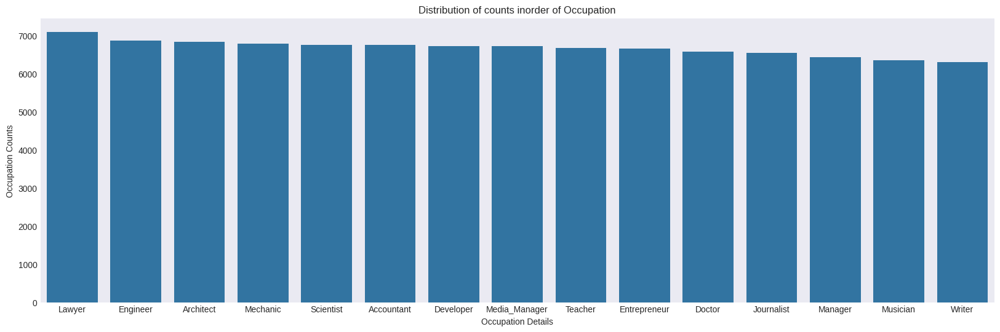

In [49]:
#occupation
plt.figure(figsize=(20,6))
ax=sns.countplot(x='Occupation',data=credit_cal,order=credit_df['Occupation'].value_counts().index)
plt.title('Distribution of counts inorder of Occupation')
plt.xlabel('Occupation Details')
plt.ylabel("Occupation Counts")
plt.show()

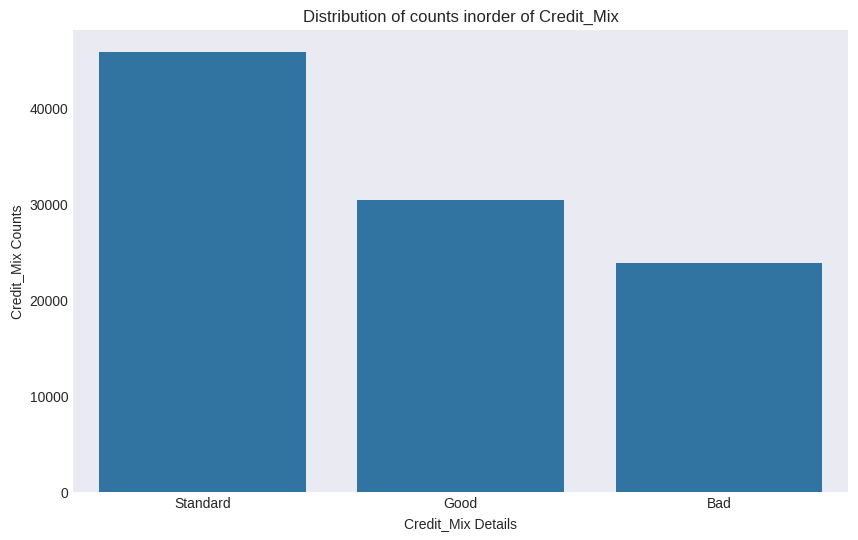

In [50]:
#credit mix
plt.figure(figsize=(10,6))
ax=sns.countplot(x='Credit_Mix',data=credit_cal,order=credit_df['Credit_Mix'].value_counts().index)
plt.title('Distribution of counts inorder of Credit_Mix')
plt.xlabel('Credit_Mix Details')
plt.ylabel("Credit_Mix Counts")
plt.show()

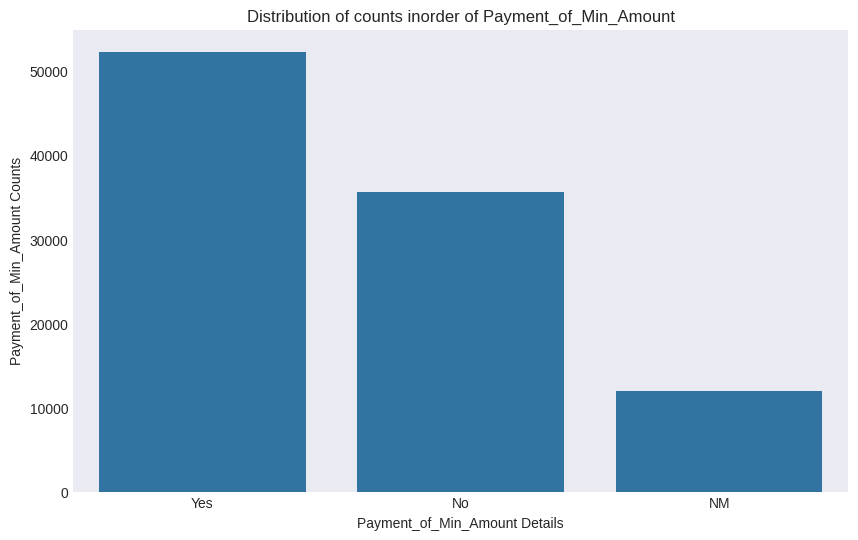

In [51]:
#Payment_of_Min_Amount
plt.figure(figsize=(10,6))
ax=sns.countplot(x='Payment_of_Min_Amount',data=credit_cal,order=credit_df['Payment_of_Min_Amount'].value_counts().index)
plt.title('Distribution of counts inorder of Payment_of_Min_Amount')
plt.xlabel('Payment_of_Min_Amount Details')
plt.ylabel("Payment_of_Min_Amount Counts")
plt.show()

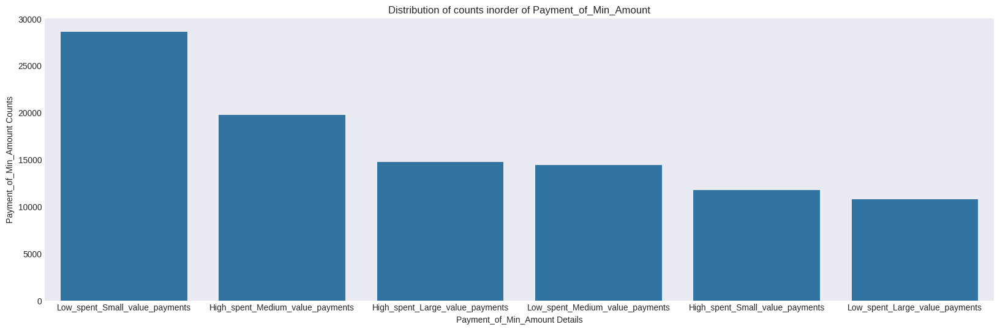

In [52]:
#Payment_Behaviour
plt.figure(figsize=(20,6))
ax=sns.countplot(x='Payment_Behaviour',data=credit_cal,order=credit_df['Payment_Behaviour'].value_counts().index)
plt.title('Distribution of counts inorder of Payment_of_Min_Amount')
plt.xlabel('Payment_of_Min_Amount Details')
plt.ylabel("Payment_of_Min_Amount Counts")
plt.show()

### Count Plot

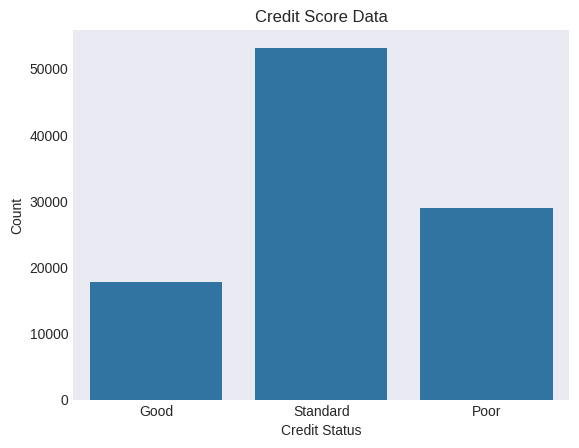

In [53]:
ax = sns.countplot(x = 'Credit_Score',data = credit_df)
plt.title('Credit Score Data')
plt.xlabel('Credit Status')
plt.ylabel('Count')
plt.show()

In [54]:
credit_num.describe().T

,count,mean,std,min,25%,50%,75%,max
Month,100000.0,4.500000,2.291299,1.000000,2.750000,4.500000,6.250000,8.000000
Age,100000.0,33.316340,10.764812,14.000000,24.000000,33.000000,42.000000,56.000000
Annual_Income,100000.0,47923.090915,34570.337168,7005.930000,19342.972500,36998.267500,68754.597500,150131.680000
Monthly_Inhand_Salary,100000.0,3981.159050,2873.322586,303.645417,1626.594167,3095.905000,5708.265000,12452.330000
Num_Bank_Accounts,100000.0,5.368820,2.593314,0.000000,3.000000,5.000000,7.000000,11.000000
Num_Credit_Card,100000.0,5.533570,2.067098,0.000000,4.000000,5.000000,7.000000,11.000000
Interest_Rate,100000.0,14.532080,8.741330,1.000000,7.000000,13.000000,20.000000,34.000000
Num_of_Loan,100000.0,3.532880,2.446356,0.000000,2.000000,3.000000,5.000000,9.000000
Delay_from_due_date,100000.0,19.437290,12.605361,0.000000,10.000000,18.000000,26.000000,55.000000
Num_of_Delayed_Payment,100000.0,13.313120,6.237166,0.000000,9.000000,14.000000,18.000000,25.000000


### Pair Plot

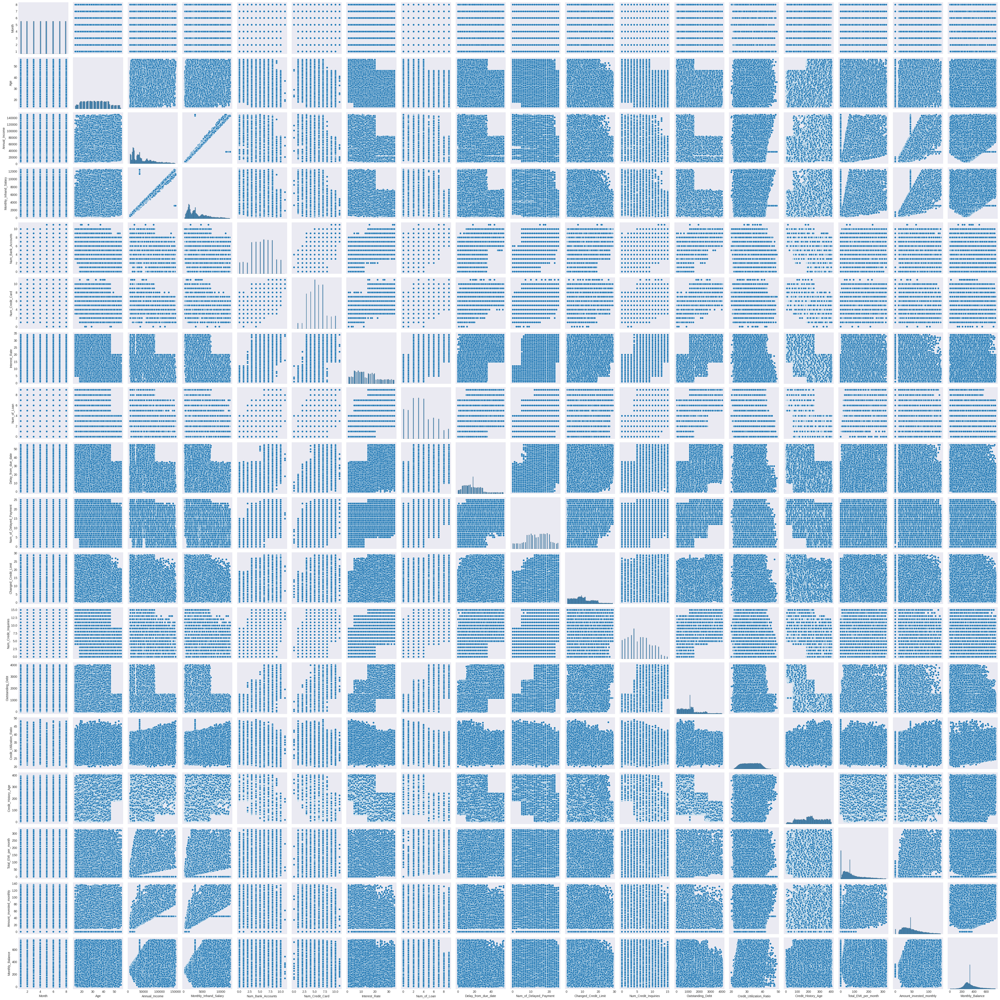

In [55]:
sns.pairplot(credit_num)

In [56]:
corr_format= credit_num.corr()
corr_format

,Month,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
Month,1.000000e+00,0.016990,-1.177001e-17,-0.001272,0.000079,0.000090,6.790115e-18,1.555542e-16,-0.000413,0.000115,-0.000874,0.128485,-3.628566e-17,0.002454,0.022784,0.009003,-9.060843e-17,-0.001129
Age,1.698955e-02,1.000000,8.537603e-02,0.083374,-0.190415,-0.148567,-2.175571e-01,-2.135330e-01,-0.168641,-0.184264,-0.159220,-0.249374,-1.909457e-01,0.025419,0.234618,-0.073007,5.245280e-02,0.096391
Annual_Income,-1.177001e-17,0.085376,1.000000e+00,0.989520,-0.238342,-0.197399,-2.671849e-01,-2.349467e-01,-0.202051,-0.229456,-0.141619,-0.251284,-2.394714e-01,0.145415,0.246819,0.405846,6.897849e-01,0.370586
Monthly_Inhand_Salary,-1.271756e-03,0.083374,9.895200e-01,1.000000,-0.237362,-0.197451,-2.668503e-01,-2.338182e-01,-0.202377,-0.229503,-0.142410,-0.251175,-2.390547e-01,0.145219,0.247085,0.404664,6.931688e-01,0.372346
Num_Bank_Accounts,7.909795e-05,-0.190415,-2.383421e-01,-0.237362,1.000000,0.442694,5.843015e-01,4.724831e-01,0.528898,0.601842,0.324094,0.512716,4.600386e-01,-0.071649,-0.485331,0.101531,-1.780112e-01,-0.224022
Num_Credit_Card,8.973261e-05,-0.148567,-1.973995e-01,-0.197451,0.442694,1.000000,4.979115e-01,4.179595e-01,0.438829,0.423300,0.243010,0.452946,4.396208e-01,-0.055194,-0.417205,0.106442,-1.516962e-01,-0.196047
Interest_Rate,6.790115e-18,-0.217557,-2.671849e-01,-0.266850,0.584302,0.497912,1.000000e+00,5.591562e-01,0.534451,0.571457,0.357507,0.625316,5.856638e-01,-0.075639,-0.576230,0.136710,-2.040545e-01,-0.257863
Num_of_Loan,1.555542e-16,-0.213533,-2.349467e-01,-0.233818,0.472483,0.417960,5.591562e-01,1.000000e+00,0.455249,0.473919,0.358290,0.562555,5.400546e-01,-0.100311,-0.605727,0.446019,-1.773190e-01,-0.375625
Delay_from_due_date,-4.128817e-04,-0.168641,-2.020512e-01,-0.202377,0.528898,0.438829,5.344505e-01,4.552487e-01,1.000000,0.513362,0.275595,0.484764,4.563819e-01,-0.060748,-0.449962,0.122672,-1.570050e-01,-0.208974
Num_of_Delayed_Payment,1.154567e-04,-0.184264,-2.294564e-01,-0.229503,0.601842,0.423300,5.714569e-01,4.739186e-01,0.513362,1.000000,0.318969,0.495574,4.441880e-01,-0.073633,-0.481965,0.111956,-1.866756e-01,-0.218577


### Heat Map

<Axes: >

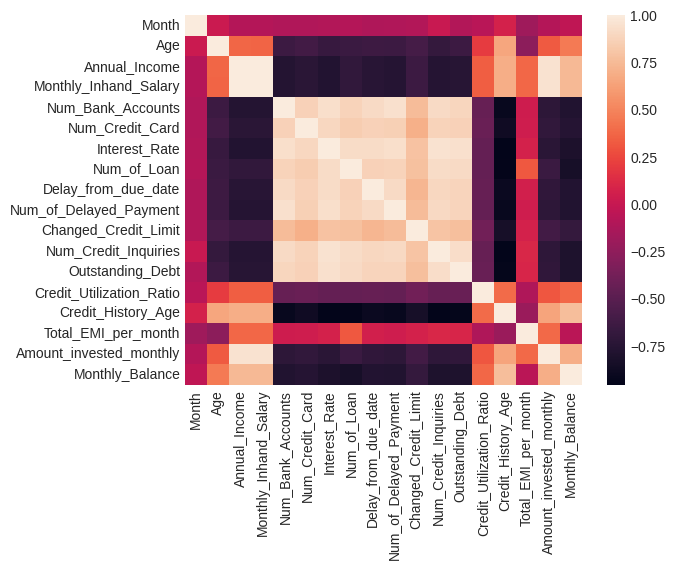

In [57]:
sns.heatmap(corr_format.corr())

In [58]:
numeric_cols= credit_df.select_dtypes(exclude='object').columns
cat_cols= credit_df.select_dtypes(include='object').columns
numeric_cols

Index(['Month', 'Age', 'Annual_Income', 'Monthly_Inhand_Salary',
       'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Credit_Utilization_Ratio',
       'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly',
       'Monthly_Balance'],
      dtype='object')

In [59]:
cat_cols

Index(['Name', 'Occupation', 'Type_of_Loan', 'Credit_Mix',
       'Payment_of_Min_Amount', 'Payment_Behaviour', 'Credit_Score'],
      dtype='object')

In [60]:
vif_credit_df = credit_df[numeric_cols]
vif_data =pd.DataFrame()
vif_data["Feature"]=vif_credit_df.columns
vif_data["VIF"]=[variance_inflation_factor(vif_credit_data.values,i) for i in range(len(vif_credit_df.columns))]
vif_data.head(17)

,Feature,VIF
0,Month,4.957805
1,Age,10.214075
2,Annual_Income,141.138586
3,Monthly_Inhand_Salary,141.871313
4,Num_Bank_Accounts,10.408261
5,Num_Credit_Card,11.881539
6,Interest_Rate,9.083604
7,Num_of_Loan,8.415696
8,Delay_from_due_date,5.792755
9,Num_of_Delayed_Payment,10.469331


### Box Plot

<ipython-input-61-5a5dd660c234>:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=credit_df, x='Monthly_Inhand_Salary', y='Credit_Score', palette='plasma_r')


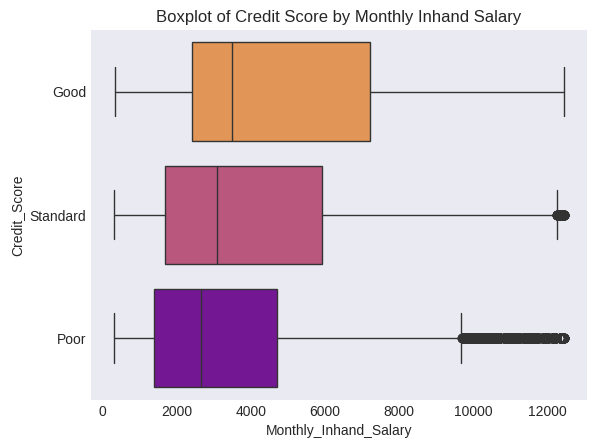

In [61]:
sns.boxplot(data=credit_df, x='Monthly_Inhand_Salary', y='Credit_Score', palette='plasma_r')
plt.title("Boxplot of Credit Score by Monthly Inhand Salary")
plt.show()

## **Splitting Data**

In [62]:
# Split the dataset into features (X) and target variable (y)
X = credit_df.drop('Credit_Score',axis=1)
y = credit_df['Credit_Score']

# Split the dataset into training and testing sets (e.g., 60% train, 40% test)
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.4,
                                                   random_state=42, stratify=y)

# Split the traing dataset into training and validating sets (e.g., 50% test, 50% validate)
X_test, X_val, y_test, y_val = train_test_split(X_test,y_test, test_size=0.5,
                                                   random_state=42, stratify=y_test)